# **AeroPython**

#### Libraries

In [19]:
from aeroClasses import *
import numpy as np
import sympy
from sympy import init_printing
from sympy.utilities.lambdify import lambdify
import time, sys
from matplotlib import pyplot as plt
from matplotlib import rc, cm
from sympy import init_printing
import math
from mpl_toolkits.mplot3d import Axes3D
import timeit
from jupyterthemes import jtplot
jtplot.style(grid=False)
# jtplot.reset()
init_printing(use_latex=True)
rc('font',**{'family':'serif'})
rc('text', usetex=True)

## Definitions

The **circulation** $\Gamma$ of a vector field $\vec f(x^i)$ about a closed contour $C$ parametrised by a vector $d \vec l$:

$$ \Gamma \equiv \oint_C \vec f(x^i) \cdot d\vec l $$

Note that the dimension of the vector space is irrelevant.

This is related to **Stokes' theorem**, which indicates the 'total' curl of the vector field for an open surface $\partial \mathcal S$:

$$ \oint_C \vec f \cdot d\vec l = \iint_{\partial \mathcal S} \left(\nabla \times \vec f\right)\cdot \vec n\ d\mathcal S $$

Similarly, the total 'emittance' of $\vec f$ over a closed surface $S$ is related to the 'total' divergence of a vector field from a volume $\mathcal V$ via **Gauss' theorem**:

$$ \iint_{\mathcal S} \vec f \cdot d\vec {\mathcal S} = \iiint_{\mathcal V}\nabla \cdot \vec f \ d\mathcal V $$

_Note:_ Gauss' and Stokes' theorems are properties of integrals, and are not particularly related to vector spaces as such.

The conservation of an _extensive property_ $N$ as it travels through a defined **control volume** $\mathcal V$, in which the conservation is described in terms of an _intensive property_ $\eta$ (such as the density or any continuum formulation), is dictated by the **Reynolds' transport theorem** in the following tempoeral formulation:

$$ \frac{DN}{Dt} = \iiint_{\mathcal V} \frac{\partial \eta}{\partial t}\ d\mathcal{V} + \iint_{\mathcal S} \eta \vec V \cdot d\vec{\mathcal S} $$

#### Fluid Mechanics

The continuity equation representing the conservation of mass is:

$$ \frac{\partial \rho}{\partial t} + \nabla\cdot (\rho \vec V) = 0 $$

An **incompressible flow** is defined as a flow in which the changes in density with respect to space and time are negligible.

The differential form of the **incompressible Navier-Stokes equations** in an external time-independent gravitational field $\vec g$ with non-conservative body forces $\vec f$ is:
    
$$ \nabla \cdot \vec V = 0 $$

$$ \rho \left[\frac{\partial \vec V}{\partial t} + (\vec V \cdot \nabla) \otimes \vec V  \right] = -\nabla p + \rho \vec g + \nabla \cdot \hat \tau + \rho\vec f$$

The energy equation reduces to Bernoulli's equation (mentioned later), which can be derived from the momentum equation above, hence it need not be considered. 

For a Newtonian fluid, the stresses are considered to be linearly proportional to the velocity gradient near a wall, with a constant $\mu$ called **viscosity**:

$$ \tau = \mu \frac{\partial u}{\partial x} $$ 

Hence the stress tensor is:

$$\hat \tau = \mu\left[\nabla \otimes \vec V +  \left(\nabla \otimes \vec V\right)^T  - \frac{2\nu}{3} \hat I\right]$$

where $\nu \equiv \nabla \cdot \vec V$, called the **dilatation strain rate**.

If the flow is inviscid, the time derivatives and the stress terms drop out, giving the **incompressible Euler equations**:

$$ \nabla \cdot \vec V = 0 $$

$$ \rho(\vec V \cdot \nabla \vec V) = -\nabla p + \rho\vec g + \vec f$$

The **vorticity** $\omega$ is defined as the curl of the velocity field $\vec V$, specifically: $ \omega \equiv \nabla \times \vec V $. Assume the flow is irrotational, i.e. $\omega = 0$, and there are no body forces, because the assumptions aren't enough. Using Stokes' theorem, $\Gamma = 0$. This describes a _conservative_ vector field, which can be expressed in the form of a scalar potential $\vec V = \nabla \phi$, when inserted into the continuity equation gives **Laplace's equation**:

$$ \nabla^2 \phi = 0 $$

As the real and imaginary parts of an analytic function of a complex variable $z$ independently satisfy Laplace's equation, another Laplace equation can be constructed by considering $\phi$ as the real part and using the Cauchy-Riemann conditions in Cartesian coordinates:

$$ \vec V = (u(x,y), v(x,y)), \quad u = \frac{\partial \phi}{\partial x} = \frac{\partial \psi}{\partial y},\quad v = \frac{\partial \phi}{\partial y} = -\frac{\partial \psi}{\partial x} $$

where $\psi$ is called a **stream function**. This leads to the construction of a **complex potential** $\Psi(z) = \phi + i \psi $. The derivative of this with respect to $z$ gives you the **complex velocity** $u - iv$. The stream function can also be constructed by the following definition of a **streamline** in three dimensions, a line which satsfies the equations:

$$ \vec V \times d\vec l = 0 $$ 

In two dimensions, say the $x$-$y$ plane, which physically relates the changes in velocity with respect to changes in space:

$$ \frac{dy}{dx} = \frac{v(x,y)}{u(x,y)} \iff u\ dy - v\ dx = 0$$

The second expression is an exact differential $d\psi =0$ if and only if the previous conditions for $\psi$ are satisfied. Note that the contours generated by $\phi$ and $\psi$ are orthogonal.

For an inviscid, incompressible flow, an energy conservation law arises by the name of **Bernoulli's equation**, which is applicable for comparisons of pressure and velocity at two points, and can be derived from the momentum equation. Assume that the external gravitational field is conservative, and hence is expressible as a scalar potential $\vec g = -\nabla \xi$, as is usually done in physics. Use the following vector identity to rewrite the momentum equation:

$$ (\vec V \cdot \nabla)\vec V = \omega \times \vec V + \frac{1}{2}\nabla\left|\vec V\right|^2 $$

$$ \frac{\partial (\nabla \phi)}{\partial t} + \nabla\left(\frac{1}{2}\left|{\nabla\phi}\right|^2\right) = \frac{\nabla p}{\rho} + \nabla \xi, \quad \because \omega = 0 $$

As partial derivatives commute, the equation can be rearranged to give:

$$ \nabla\left(\frac{\partial \phi}{\partial t} + \frac{1}{2}\left|{\nabla \phi}\right|^2 + \frac{p}{\rho} + \xi\right) = 0 $$

Which gives the unsteady Bernoulli equation:

$$ \implies \frac{\partial \phi}{\partial t} + \frac{1}{2}\left|{\nabla \phi}\right|^2 + \frac{p}{\rho} + \xi = h(t) $$

Note that the pressure is actually defined with reference to some zero point reference value, and only the differences are compared, similarly to energy. Usually, this equation is used in a steady case along a streamline. A physical description of this would be: Along a flow of constant energy, when a fluid flows through a region of higher pressure, it slows down, and vice versa. A similar equation can be derived for compressible flows.

**Vortex lines** can be defined analogously to the definition of the streamline:

$$ \omega \times d\vec l = 0 $$

#### Aside: Mathematical Generality

Electromagnetics and fluid dynamics are usually about almost exclusively solving partial differential equations either analytically or numerically. The Laplace equation also governs the basic laws of electrostatics, which can be derived from Maxwell's equations. So let's look at some basic solutions first for the **Poisson equation** with a source $\rho$, a more general form of Laplace's equation first in $N$ dimensions:

$$ \nabla_N^2 \phi(\vec x) = \rho(\vec x) $$

This can be solved via the method of Green functions:

\begin{align*}
\nabla_N^2 G(\vec x, \vec x_0) & = \delta(\vec x - \vec x_0) \\
\int_{-\infty}^{\infty} \left[\nabla_N^2 G(\vec x, \vec x_0)\right]  e^{i\vec k \cdot \vec x}\ d\vec x & = \int_{-\infty}^{\infty} \delta(\vec x - \vec x_0) e^{i\vec k \cdot \vec x}\ d\vec x \\
|\vec k|^2 G(\vec k, \vec x_0) & = e^{i \vec k \cdot \vec x_0} \\
\implies G(\vec x, \vec x_0) & = \frac{1}{2\pi}\int_{-\infty}^{\infty} \frac{e^{-i \vec k \cdot (\vec x -\vec x_0)}}{|\vec k|^2} \ d\vec k
\end{align*}

Laplace's equation is spherically symmetric in $n$ dimensions, so expressing the integral in that coordinate system will be more convenient. This is singular with multiple poles at $\vec k = \vec 0$, so the contour must be deformed in the complex plane.

#### Potential Flows

So a majority of basic (and unrealistic!) fluid flows can be generated by solving Laplace's equation for $\psi$ (the streamlines) using certain boundary conditions and declarations of $u, v$, which is somewhat of an inverse problem. The incompressible Euler equation is then used to evaluate the pressure. Sometimes coordinate transformations would be required to integrate the PDEs more easily, but they might introduce scale factors. Note that the cases analysed are 2D, but can be generalised readily. As von Neumann said, analysis under so many assumptions makes this like studying 'dry water'.

Laplace's equation is linear, so any superposition of different solutions will give you a new function describing a more general flow. A common point of analysis in potential flows is the **stagnation point**, at which $u(x,y) = v(x,y) = 0$. This is equivalent to finding the extrema of the solutions to the potential or stream functions, and the minima correspond to stagnation points.

Usually in aerodynamic flows, the **pressure coefficient** is an important quantity to measure local pressure $p$ at some point compared to the freestream pressure $p_{\infty}$, using the Bernoulli equation in an external flow with freestream speed $V_{\infty}$:

$$ C_p \equiv \frac{p - p_{\infty}}{\frac{1}{2}\rho V_{\infty}^2} = 1 - \left(\frac{V}{V_{\infty}}\right)^2 $$

## Source and Sink Flow

Consider a situation in which an ideal fluid is emanating/culminating from/to a point source in a perfect vacuum at a constant radial rate $\sigma$. This situation can somewhat naively be represented by the following conditions in polar coordinates with $r = \sqrt{\left(x-x_\text{source}\right)^2 + \left(y-y_\text{source}\right)^2},\ \theta = \tan^{-1} [(y-y_\text{source})/(x-x_\text{source})]$:

$$ u_r = \frac{\sigma}{2\pi r}, \quad u_{\theta} = 0 $$

This is like Coulomb's law of electrostatics for charges in 2 dimensions. 

The solution for the velocity potential is:

$$ \frac{\partial\phi}{\partial r} = \frac{\sigma}{2\pi r}, \quad \frac{1}{r}\frac{\partial \phi}{\partial \theta} = 0 $$

$$ \implies \phi(r, \theta) = \frac{\sigma}{2\pi}\ln r + n, \quad n \in \mathbb R $$

The solution for the stream function is:

$$ \frac{1}{r}\frac{\partial\psi}{\partial \theta} = \frac{\sigma}{2\pi r}, \quad -\frac{\partial \psi}{\partial r} = 0 $$

$$ \implies \psi(r,\theta) = \frac{\sigma}{2\pi}\theta + k, \quad k \in \mathbb R$$

The constants $k, n$ are dependent on the boundary conditions, which we will set to $\psi(r, 0) = 0 \implies k = 0$, $\phi(1, \theta) = 0$. They're not very important since the quantities are differentiated anyway, so we will ignore these from now on. Note that even if they're non-zero, the functions can be redefined as $\psi - n,\ \phi - k$ with no change to the physics, so this is allowed.

The complex potential of a source or sink can be written as a single expression in polar coordinates:
 
$$ \Psi(r,\theta) = \frac{\sigma}{2\pi}\left(\ln r + i\theta\right) = \frac{\sigma}{2\pi}\left(\ln{r} + \ln e^{i\theta}\right)$$

$$ \implies \Psi(z) = \frac{\sigma}{2\pi}\ln{z}, \quad z = re^{i\theta} $$

This function is not well-defined for $\Re(z) = 0$, which corresponds to the origin.

In Cartesian coordinates, the velocity is expressed as:

$$u = \frac{\partial\psi}{\partial y} = \frac{\sigma}{2\pi}\frac{x-x_\text{source}}{\left(x-x_\text{source}\right)^2+\left(y-y_\text{source}\right)^2}$$

$$v = -\frac{\partial\psi}{\partial x} = \frac{\sigma}{2\pi}\frac{y-y_\text{source}}{\left(x-x_\text{source}\right)^2+\left(y-y_\text{source}\right)^2}$$

Now we will compute the streamlines and potential lines, and plot them.

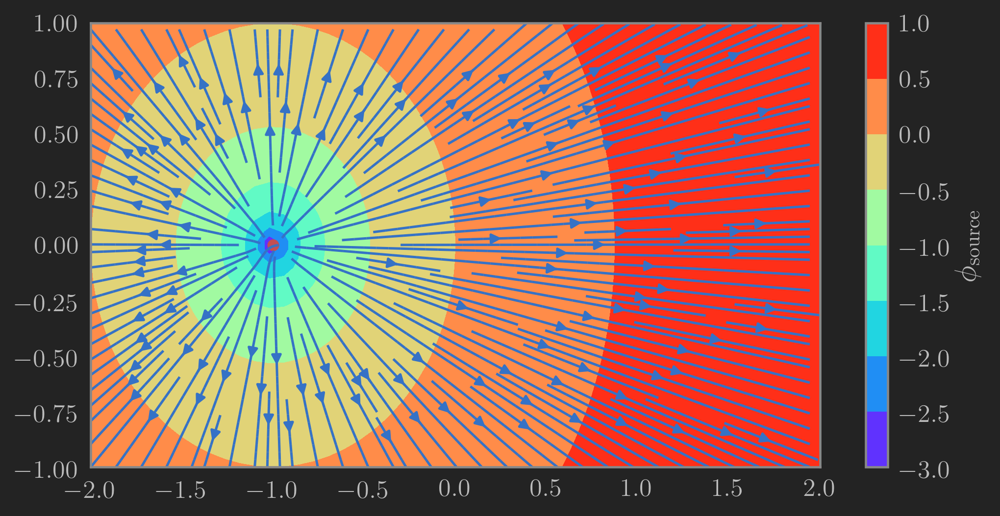

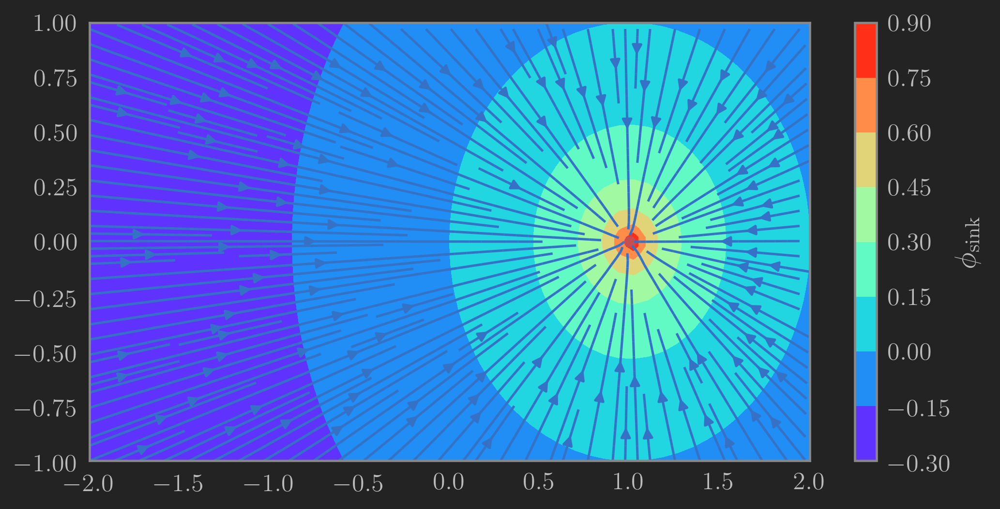

In [234]:
x_domain, y_domain = (-2, 2), (-1, 1)
source_strength = 5.0
sink_strength = -1.5
x_source, y_source = -1.0, 0.0
x_sink, y_sink = 1.0, 0.0
grid_size = 50
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

source = lambda strength, x, y, x_0, y_0: (strength/(2*np.pi)*(x - x_0)/((x - x_0)**2 + (y - y_0)**2), strength/(2*np.pi)*(y - y_0)/((x - x_0)**2 + (y - y_0)**2))

src = source(source_strength, X, Y, x_source, y_source)
snk = source(sink_strength, X, Y, x_sink, y_sink)

potential = lambda strength, x, y, x_0, y_0: strength/(2*np.pi)*np.log(np.sqrt((x - x_0)**2 + (y - y_0)**2))

src_pot = potential(source_strength, X, Y, x_source, y_source)
snk_pot = potential(sink_strength, X, Y, x_sink, y_sink)

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig1 = plt.figure(1, figsize=(width, height), dpi=300)
plt.streamplot(X, Y, src[0], src[1], density=2)
plt.contourf(X, Y, src_pot, cmap=cm.rainbow)
plt.colorbar(label=r'$\phi_{\mathrm{source}}$')
plt.scatter(x_source, y_source,
               color='r', marker='o');
plt.xlim(x_domain)
plt.ylim(y_domain)

fig2 = plt.figure(2, figsize=(width, height), dpi=300)
plt.streamplot(X, Y, snk[0], snk[1], density=2)
plt.contourf(X, Y, snk_pot, cmap=cm.rainbow)
plt.colorbar(label=r'$\phi_{\mathrm{sink}}$')
plt.scatter(x_sink, y_sink,
               color='r', marker='o');
plt.xlim(x_domain)
plt.ylim(y_domain)

plt.show()

This can be cleaned up and written into a class (in `aeroClasses.py` for cleanliness) for repeated usage. Source-sink pair example:

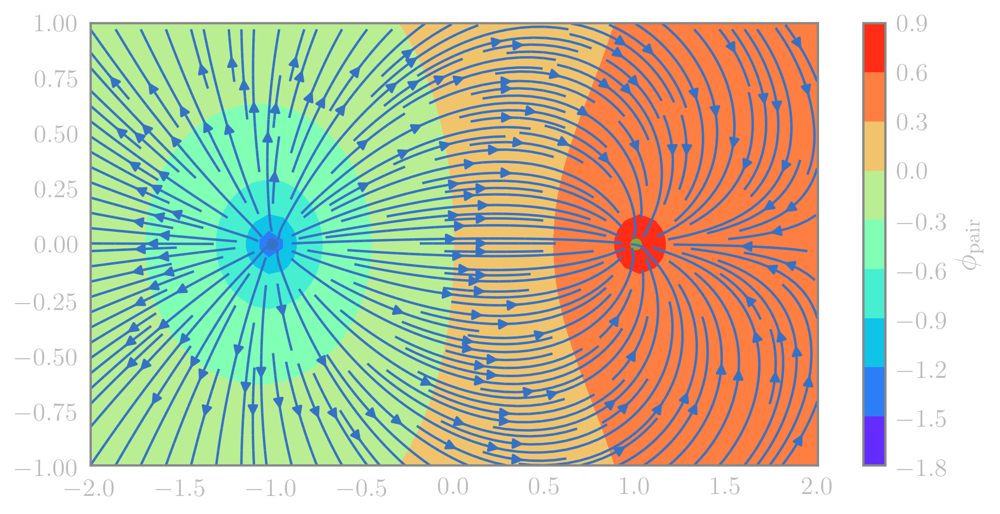

In [2]:
src1_strength = 5.0
src2_strength = -2.0
x1, y1 = -1.0, 0.0
x2, y2 = 1.0, 0.0
grid_size = 50
x_domain, y_domain = (-2, 2), (-1, 1)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

src1 = Source2D(src1_strength, x1, y1)
src2 = Source2D(src2_strength, x2, y2)
pair = [ src1.velocity(X, Y)[i] + src2.velocity(X, Y)[i] for i in range(2) ]
pot = src1.potential(X, Y) + src2.potential(X, Y)
stream = src1.stream_func(X, Y) + src2.stream_func(X, Y)

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig4 = plt.figure(3, figsize=(width, height), dpi=300)
plt.streamplot(X, Y, pair[0], pair[1], density=2)
plt.contourf(X, Y, pot, cmap=cm.rainbow)
plt.colorbar(label=r'$\phi_{\mathrm{pair}}$')
plt.scatter(x1, y1, marker='o')
plt.scatter(x2, y2, marker='o')
plt.xlim(x_domain)
plt.ylim(y_domain);

## Uniform Flow

A uniform flow is defined as a flow with a fixed magnitude $U_{\infty}$ and direction $\alpha$ everywhere in the domain. The velocity is expressed as follows in Cartesian coordinates:

$$ u = U_{\infty}\cos\alpha, \quad v = U_{\infty}\sin\alpha $$

The solution for the velocity potential is:

$$ \frac{\partial \phi}{\partial x} = U_{\infty}\cos\alpha, \quad \frac{\partial \phi}{\partial y} = U_{\infty}\sin\alpha $$ 

$$ \implies \phi(x,y) = U_{\infty}\left(x\cos\alpha + y\sin\alpha\right) $$

The solution for the stream function is:

$$ \frac{\partial \psi}{\partial y} = U_{\infty}\cos\alpha, \quad -\frac{\partial \psi}{\partial x} = U_{\infty}\sin\alpha $$ 

$$ \implies \psi(x,y) = U_{\infty}\left(y\cos\alpha - x\sin\alpha\right) $$

#### Uniform with Source Flow

Velocity potential: 
    
$$ \phi(x,y) = U_{\infty}(x\cos\alpha + y\sin\alpha) + \frac{\sigma}{4\pi}\ln \left[(x - x_{\mathrm{source}})^2 + (y - y_{\mathrm{source}})^2\right] $$

Stream function:

$$\psi(x,y) = U_\infty (y\cos\alpha - x\sin\alpha) + \frac{\sigma}{2\pi} \tan^{-1} \left(\frac{y-y_\text{source}}{x-x_\text{source}}\right) $$

The stagnation point $(r_s, \theta_s)$ can be computed for this case in polar coordinates.

$$ u_r = U_{\infty}\cos(\theta_s - \alpha) + \frac{\sigma}{2\pi r_s} = 0, \; u_{\theta} = -U_{\infty} \sin(\theta_s - \alpha) = 0$$

$$ \implies (r_s, \theta_s) = \left( \frac{\sigma}{2\pi U_{\infty}}, \pm n\pi + \alpha \right), \quad n \in \mathbb [0, 1] $$

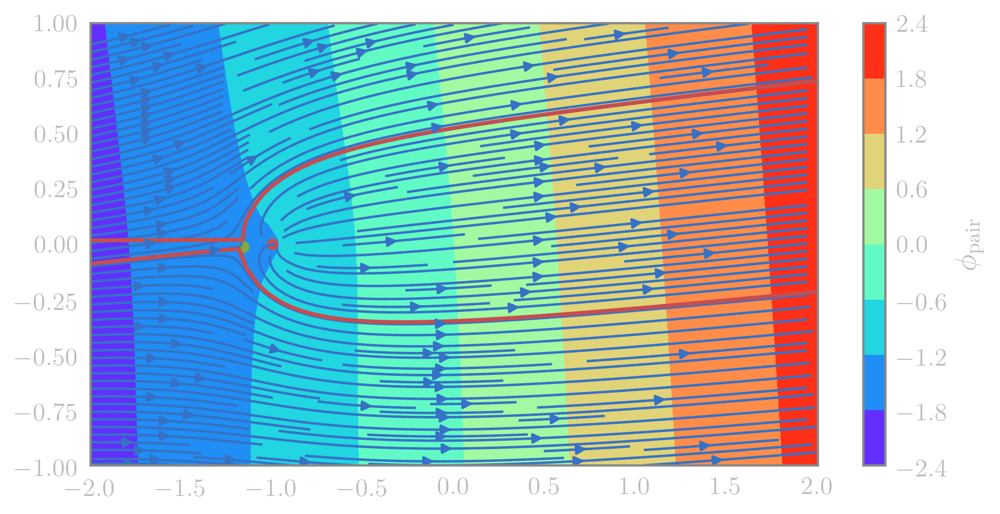

In [3]:
uniform_mag = 1.0
uniform_ang = 5.0
src1_strength = 1.0
x1, y1 = -1.0, 0.0
grid_size = 50
x_domain, y_domain = (-2, 2), (-1, 1)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

uniform = Uniform2D(uniform_mag, uniform_ang)
src1 = Source2D(src1_strength, x1, y1)
vels = [ src1.velocity(X, Y)[i] + uniform.velocity(X, Y)[i] for i in range(2) ]
pot = src1.potential(X, Y) + uniform.potential(X, Y)
stream = src1.stream_func(X, Y) + uniform.stream_func(X, Y)
r_stag, theta_stag = src1_strength/(2*np.pi*uniform_mag), np.deg2rad(uniform_ang)
x_stag, y_stag = x1 - r_stag*np.cos(theta_stag), y1 - r_stag*np.sin(theta_stag)

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig5= plt.figure(1, figsize=(width, height), dpi=300)
plt.streamplot(X, Y, vels[0], vels[1], density=2)
plt.contourf(X, Y, pot, cmap=cm.rainbow)
plt.colorbar(label=r'$\phi_{\mathrm{pair}}$')
plt.scatter(x1, y1, color='r', marker='o')
plt.contour(X, Y, stream,
               levels=[-src1_strength / 2. + 0.1, src1_strength / 2. + 0.1], 
               colors='r', linewidths=2, linestyles='solid');
plt.scatter(x_stag, y_stag, color='g', marker='o')
plt.xlim(x_domain)
plt.ylim(y_domain);

#### Rankine Oval

A **Rankine Oval** is a special case of uniform flow superposed with source and sink flow, in which the strengths of the source and sink are the same, and the freestream is collinear with the line connecting them. This is important for some reason, and the pressure coefficient will be computed.

Velocity potential:

$$ \phi(x,y) = U_{\infty}(x\cos\alpha + y\sin\alpha) + \frac{\sigma}{4\pi}\ln \left[\frac{(x - x_{\mathrm{source}})^2 + (y - y_{\mathrm{source}})^2}{(x - x_{\mathrm{sink}})^2 + (y - y_{\mathrm{sink}})^2}\right], \qquad \alpha = \tan^{-1}\left(\frac{y_{\mathrm{source}} - y_{\mathrm{sink}}}{x_{\mathrm{source}} - x_{\mathrm{sink}}}\right) $$

Stream function:

$$\psi(x,y) = U_\infty (y\cos\alpha - x\sin\alpha) + \frac{\sigma}{2\pi} \left[\tan^{-1} \left(\frac{y-y_\text{source}}{x-x_\text{source}}\right) - \tan^{-1} \left(\frac{y-y_\text{sink}}{x-x_\text{sink}}\right)\right], \qquad \alpha = \tan^{-1}\left(\frac{y_{\mathrm{source}} - y_{\mathrm{sink}}}{x_{\mathrm{source}} - x_{\mathrm{sink}}}\right) $$

Length and width:

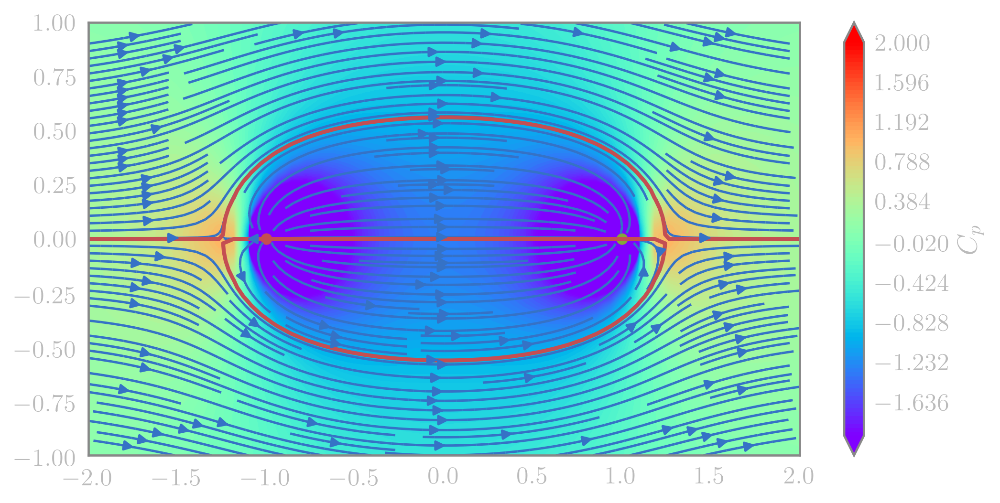

In [4]:
uniform_mag = 3.0
uniform_ang = 0.0
src1_strength = 5.0
src2_strength = -5.0
x1, y1 = -1.0, 0.0
x2, y2 = 1.0, 0.0
grid_size = 50
x_domain, y_domain = (-2, 2), (-1, 1)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

uniform = Uniform2D(uniform_mag, uniform_ang)
src1 = Source2D(src1_strength, x1, y1)
src2 = Source2D(src2_strength, x2, y2)
vels = [ src1.velocity(X, Y)[i] + src2.velocity(X, Y)[i] + uniform.velocity(X, Y)[i] for i in range(2) ]
pots = src1.potential(X, Y) + src2.potential(X, Y)+ uniform.potential(X, Y)
streams = src1.stream_func(X, Y) + src2.stream_func(X, Y) + uniform.stream_func(X, Y)
cp = pressure_coefficient2D(vels[0], vels[1], uniform_mag)

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig6 = plt.figure(1, figsize=(width, height), dpi=300)
plt.streamplot(X, Y, vels[0], vels[1], density=2)
plt.contourf(X, Y, cp, levels=np.linspace(x_domain[0], x_domain[1], 100), extend='both', cmap=cm.rainbow)
plt.colorbar(label=r'$C_p$')
CS1 = plt.contour(X, Y, streams,
               levels=[0.], 
               colors='r', linewidths=2, linestyles='solid')
plt.scatter(x1, y1, color='r', marker='o')
plt.scatter(x2, y2, color='g', marker='o')
plt.xlim(x_domain)
plt.ylim(y_domain);

## Doublet Flow

When you look at a source-sink pair from very far away with strengths proportionally increasing with distance relative to evaluation points, you obtain a contrived approximation called a **doublet**, or what's known as a dipole in electrostatics.

![svg](Images/Doublet.svg)

Velocity potential:

$$ \phi(x,y) = \lim_{l \to 0} \frac{\sigma}{4\pi}\ln \left[\frac{(x + l/2)^2 + y^2}{(x - l/2)^2 + y^2}\right] = ???$$

Stream function:

$$\psi(r,\theta) = -\frac{\sigma}{2\pi}\left(\theta_1 - \theta_2\right) \equiv -\frac{\sigma}{2\pi}\Delta\theta $$

From the above figure, $P(x,y)$ is some point very far away from the sources and sinks, i.e. $b, r \gg l$, so $\sin\Delta\theta \approx \Delta\theta$, which gives:

$$\psi(r,\theta) = \lim_{l \to 0} \frac{\sigma}{2\pi}\frac{a}{b} \approx \lim_{l \to 0} \frac{\sigma}{2\pi}\frac{l\sin\theta}{r - l\cos\theta},\quad \because \theta_1 \approx \theta_2 = \theta,\ b \approx r - l\cos\theta_1$$

Now $\sigma l$ is defined to be constant, so it can be combined into one _doublet strength_ $\kappa$. Evaluating the limit gives the final form:

$$ \psi(r,\theta) = -\frac{\kappa}{2\pi}\frac{\sin\theta}{r} $$

$$ \psi(x,y) = -\frac{\kappa}{2\pi}\frac{y}{x^2 + y^2} $$

The position of the doublet can be translated by the transformation $(x,y) \to (x - x_{\mathrm{position}}, y - y_{\mathrm{position}})$.

#### Doublet with Uniform Flow

Stream function:

$$ \psi(r, \theta) = U_{\infty}r\sin(\theta - \alpha) - \frac{\kappa}{2\pi}\frac{\sin\theta}{r} $$

Stagnation points:

$$ u_r = U_{\infty}\cos(\theta_s - \alpha) - \frac{\kappa}{2\pi}\frac{\cos\theta_s}{r_s^2} = 0$$

$$ u_{\theta} = -U_{\infty}\sin(\theta_s - \alpha) - \frac{\kappa}{2\pi}\frac{\sin\theta_s}{r_s^2} = 0$$

These equations are nonlinear, so we will look at a simpler case first, with $\alpha = 0$. Note that the doublet angle could equivalently be rotated by $\alpha$ to simplify the problem, but this would result in a new stream function in which numerous interesting physics cases would be lost.

Stagnation points of the cylinder centered at $(0,0)$:

$$ (r_s, \theta_s) = \left(\sqrt{\frac{\kappa}{2\pi U_{\infty}}}, n\pi \right), \quad n \in [0,1] $$

Points where the speed is maximum:

$$ (r_s, \theta_s) = \left(\sqrt{\frac{\kappa}{2\pi U_{\infty}}}, \pm \frac{\pi}{2} \right) $$

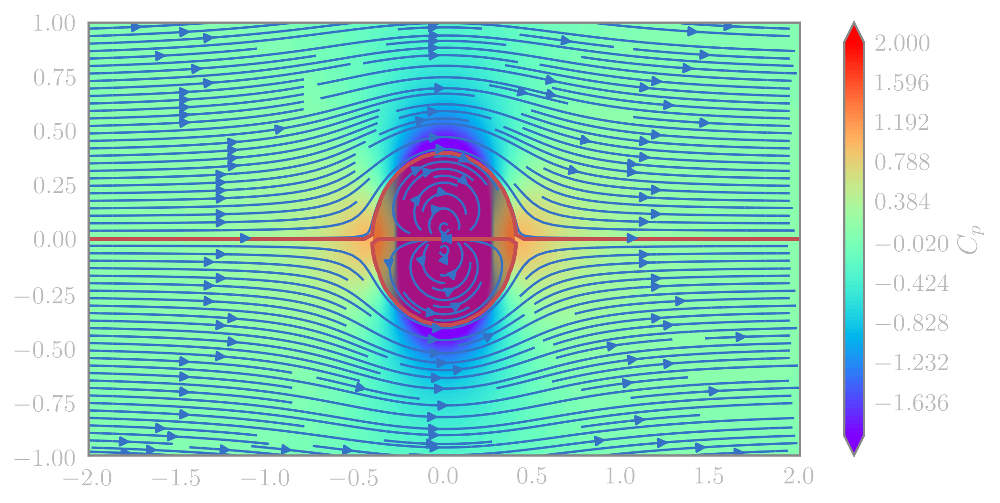

In [5]:
grid_size = 50
x_domain, y_domain = (-2, 2), (-1, 1)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

kappa = 1.0
x_doublet, y_doublet = 0.0, 0.0
uniform_mag = 1.0
uniform_ang = 0.0

uniform = Uniform2D(uniform_mag, uniform_ang)
doublet = Doublet2D(kappa, x_doublet, y_doublet)
vels = [ uniform.velocity(X, Y)[i] + doublet.velocity(X, Y)[i] for i in range(2) ]
streams = uniform.stream_func(X, Y) + doublet.stream_func(X, Y)
pots = uniform.potential(X, Y) + doublet.potential(X, Y)
cp = pressure_coefficient2D(vels[0], vels[1], uniform_mag)

width = 8
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig7 = plt.figure(1, figsize=(width, height), dpi=300)
plt.streamplot(X, Y, vels[0], vels[1], density=2)
plt.contourf(X, Y, cp, levels=np.linspace(x_domain[0], x_domain[1], 100), extend='both', cmap=cm.rainbow)
plt.colorbar(label=r'$C_p$')
CS1 = plt.contour(X, Y, streams,
               levels=[0.], 
               colors='r', linewidths=2, linestyles='solid')
R = math.sqrt(kappa / (2 * math.pi * uniform_mag))
circle = plt.Circle((0, 0), radius=R, color='#CD2305', alpha=0.5)
plt.gca().add_patch(circle)
plt.xlim(x_domain)
plt.ylim(y_domain);

This example is where the actual use of summation of solutions to Laplace's equation is apparent in determining velocities. When combined with a uniform flow, this can approximate the potential flow over a cylinder. The result is a flow in which the pressure coefficient distribution is symmetric about both axes if the location of the doublet is at the origin. This implies that there is no drag force across the cylinder, which is the first failure of potential flow theory, and is called **D'Alembert's paradox**. This is a failure because experiments indicate that a cylinder does generate a drag force, and the cause for this is usually explained by the viscous terms from the Navier-Stokes equations, which have been ignored in this mathematical framework.

In this case, the stream function can be written as:

$$ \psi(r, \theta) = U_{\infty}r\sin\theta\left(1 - \frac{r_s^2}{r^2}\right) $$

So at $r = r_s \implies \psi = 0$, corresponding to the streamline at the surface of the cylinder. The velocity of the cylinder at the surface only has a radial component that varies with the angle, which results in the speed:

$$ u^2(\theta) = u_r^2(r_s, \theta) + u_{\theta}^2(r_s,\theta) = 4U_{\infty}^2\sin^2\theta$$

So the pressure coefficient across the surface can be computed as:

$$ C_p(\theta) = 1 - \frac{u^2}{U_{\infty}^2} = 1 - 4\sin^2\theta $$

## Source Flow on an Airfoil

A collection of sources can be used to approximate the flow around an airfoil. The case under consideration is a NACA 0012 symmetrical airfoil in an external flow of $1\ m/s$ at $0^{\circ}$ angle of attack. The stagnation points occur at the leading and trailing edges of the airfoil where the velocity is zero due to the symmetry.

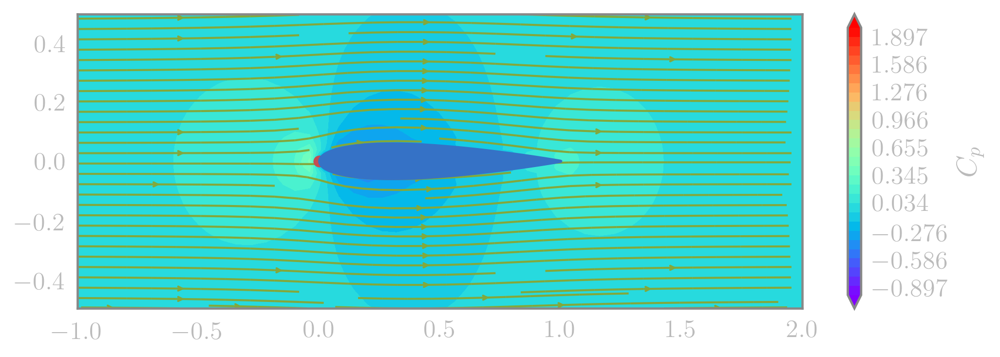

In [6]:
# Import data
x_coords = np.loadtxt('NACA0012_x.txt')
y_coords = np.loadtxt('NACA0012_y.txt')
sources = np.loadtxt('NACA0012_sigma.txt')
y_pos = list(filter(lambda x: x >= 0, y_coords))
y_neg = list(filter(lambda x: x <= 0, y_coords))

# Define grid
grid_size = 51
x_domain, y_domain = (-1, 2), (-0.5, 0.5)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

# Potentials
uniform_mag = 1.0
uniform_ang = 0.0
uniform = Uniform2D(uniform_mag, uniform_ang)
srcs = [ Source2D(sigma, x, y) for x, y, sigma in zip(x_coords, y_coords, sources) ]
vels = [ uniform.velocity(X, Y)[i] + sum([ point.velocity(X, Y)[i] for point in srcs ]) for i in range(2) ]
pots = uniform.potential(X, Y) + sum([ point.potential(X, Y) for point in srcs ])
streams = uniform.stream_func(X, Y) + sum([ point.stream_func(X, Y) for point in srcs ])
cp = pressure_coefficient2D(vels[0], vels[1], uniform_mag)

# Stagnation point
x_stag = 0.0
y_stag = 0.0

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig8 = plt.figure(1, figsize=(width, height), dpi=300)
plt.plot(x_coords, y_coords)
plt.contourf(X, Y, cp, levels=np.linspace(x_domain[0], x_domain[1], 30), extend='both', cmap=cm.rainbow)
plt.colorbar(label=r'$C_p$')
plt.streamplot(X, Y, vels[0], vels[1], density=1, linewidth=1, arrowsize=0.5, arrowstyle='->', zorder=1)
plt.fill(x_coords, y_coords)
plt.scatter(x_stag, y_stag, color='r', marker='o')
plt.xlim(x_domain)
plt.ylim(y_domain);

## Vortex Flow

A **vortex** can be defined as a flow in which the velocities on tangential streamlines, constructed as concentric circles with the vortex point as the centre, are inversely proportional to the radius, and the radial velocities are $0$. Note that this construction is essentially 'dual' to a source. 

#### Aside: Taylor-Couette Instability

An example for the construction that leads to a vortex flow would be a single cylinder rotating in an incompressible, viscous Newtonian fluid at a constant angular velocity, which leads to an interesting derivation.

The 2D continuity equation in polar coordinates is:

$$ \frac{\partial (ru_r)}{\partial r} + \frac{\partial u_{\theta}}{\partial \theta} = 0 $$

as $u_r = 0$, solving this equation gives $u_{\theta} = u_{\theta}(r)$.

The momentum equation in this case is:

#### Vortex

Consider the circulation of such a flow along the streamline, with the convention that an anti-clockwise rotation is positive (because the left-hand-path $>$ right-hand-path):

$$ \Gamma = \oint_C \vec V \cdot d\vec l = 2\pi ru_{\theta} $$

Hence the velocity components are:

$$ u_r = 0, \quad u_{\theta} = \frac{\Gamma}{2\pi r} $$

Note that vortex flows are irrotational, which can be readily checked. A physical explanation of this is that the fluid particles are revolving about a point with some angular momentum, but are themselves not rotating about their vaguely defined intrinsic points.

Velocity potential:

$$ \frac{\partial \phi}{\partial r} = 0, \quad \frac{1}{r}\frac{\partial \phi}{\partial \theta} =  \frac{\Gamma}{2\pi r} $$ 

$$ \implies \phi(r,\theta) = \frac{\Gamma}{2\pi}\theta$$

Stream function:

$$ \frac{1}{r}\frac{\partial \psi}{\partial \theta} = 0, \quad -\frac{\partial\psi}{\partial r} = \frac{\Gamma}{2\pi r} $$ 

$$ \implies \psi(r,\theta) = -\frac{\Gamma}{2\pi}\ln r $$

The complex potential of a single vortex can also be written in a single expression in polar coordinates:
 
$$ \Psi(r,\theta) = \frac{\Gamma}{2\pi}\left(\theta - i\ln{r}\right) = \frac{\Gamma}{2\pi}\left(-i\ln e^{i\theta} - i\ln{r}\right)$$

$$ \implies \Psi(z) = -\frac{i\Gamma}{2\pi}\ln{z}, \quad z = re^{i\theta} $$

So source and vortex flows are isomorphic under the transformation of the complex potential $f\colon \Psi_{\mathrm{source}} \to \Psi_{\mathrm{vortex}}, \sigma \stackrel{f}\mapsto -i\Gamma$, or equivalently $\phi_s \stackrel{f}\mapsto -\psi_v,\ \psi_s \stackrel{f} \mapsto \phi_v$, with different physics arising due to the definitions. The location of the vortex is adjusted by the translation $z \mapsto z - z_0$.

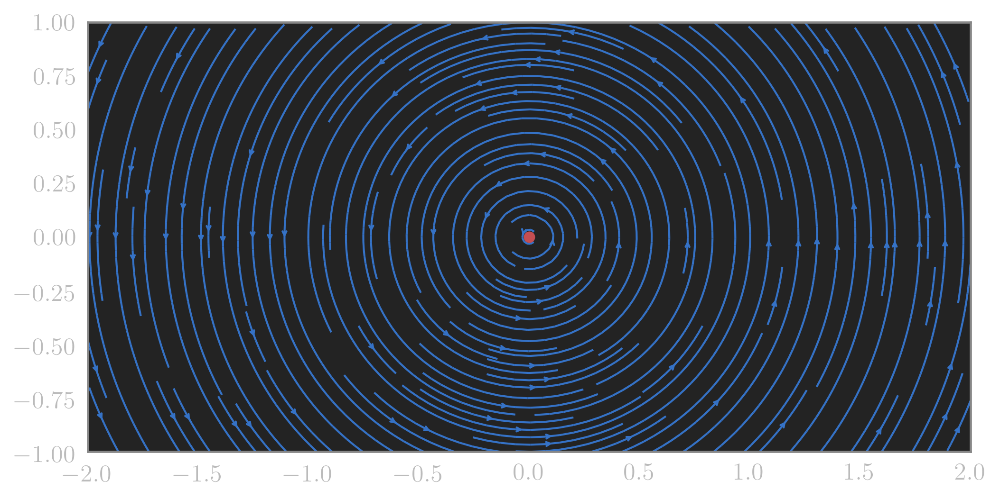

In [7]:
grid_size = 50
x_domain, y_domain = (-2, 2), (-1, 1)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

gamma = 1.0
x_loc, y_loc = 0.0, 0.0

vortex = Vortex2D(gamma, x_loc, y_loc)
vels = vortex.velocity(X, Y)
stream = vortex.stream_func(X, Y)
pot = vortex.potential(X, Y)

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig9 = plt.figure(1, figsize=(width, height), dpi=300)
plt.streamplot(X, Y, vels[0], vels[1], density=2, linewidth=1, arrowsize=0.5, arrowstyle='->', zorder=1)
plt.scatter(x_loc, y_loc, color='r', marker='o')
plt.xlim(x_domain)
plt.ylim(y_domain);

#### Vortex with a Sink Flow

Let's try to approximate the flow of a toilet flush by superposing a vortex and a sink at the same location.

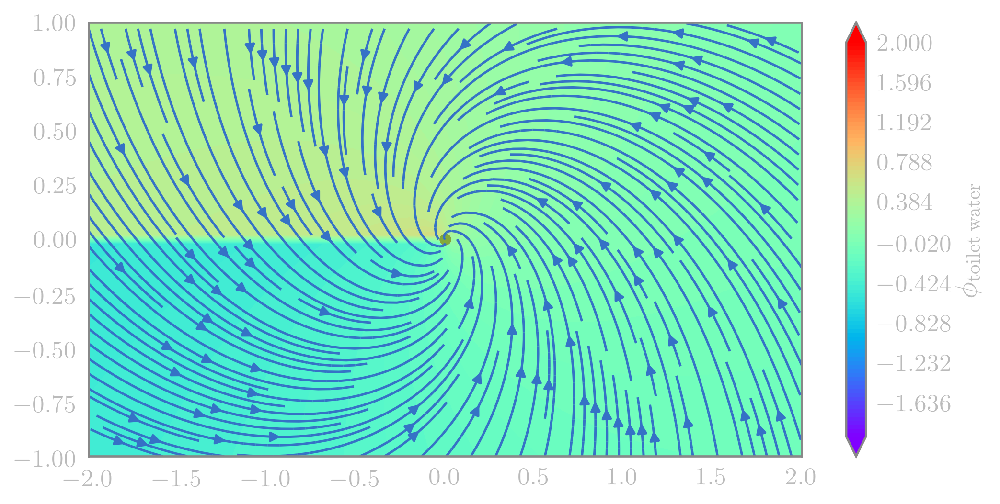

In [8]:
grid_size = 50
x_domain, y_domain = (-2, 2), (-1, 1)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

gamma = 1.0
sigma = -1.0
x_vor, y_vor = 0.0, 0.0
x_sink, y_sink = 0.0, 0.0

vortex = Vortex2D(gamma, x_vor, y_vor)
sink = Source2D(sigma, x_sink, y_sink)
vels = [ vortex.velocity(X, Y)[i] + sink.velocity(X, Y)[i] for i in range(2) ]
streams = vortex.stream_func(X, Y) + sink.stream_func(X, Y)
pots = vortex.potential(X, Y) + sink.potential(X, Y)

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig10 = plt.figure(1, figsize=(width, height), dpi=300)
plt.streamplot(X, Y, vels[0], vels[1], density=2)
plt.contourf(X, Y, pots, levels=np.linspace(x_domain[0], x_domain[1], 100), extend='both', cmap=cm.rainbow)
plt.colorbar(label=r'$\phi_{\mathrm{toilet\;water}}$')
plt.scatter(x_vor, y_vor, color='r', marker='o')
plt.scatter(x_sink, y_sink, color='g', marker='o')
plt.xlim(x_domain)
plt.ylim(y_domain);

#### Vortex Sheet

Construct a one-dimensional lattice of uniformly spaced unidirectional vortices of equal strength on a straight line segment; this is called a **vortex sheet**. 

Here we will consider the $x$-axis as the straight line. In the following, $a$ will be the spacing between adjacent vortices, $n \in \mathbb Z$ will denote their multiples of $a$ for their $x$-coordinate, and $2N + 1$ will be the total number of vortices so that one vortex always sits at the origin to generate a symmetric distribution for the sake of illustration; however, this is not compulsory.

Velocity potential:

$$ \phi(x,y) = \frac{\Gamma}{2\pi}\sum^N_{n = -N} \tan^{-1}\left(\frac{y}{x - x_n}\right) = \frac{\Gamma}{2\pi}\sum^N_{n = -N} \tan^{-1}\left(\frac{y}{x - na}\right), \quad x_{n+1} - x_n = a, \; a \in \mathbb R $$

Stream function:

$$ \psi(x,y) = -\frac{\Gamma}{2\pi} \sum_{n = -N}^N \ln{(x - x_n)} = -\frac{\Gamma}{2\pi}\ln{\prod_{i = -N}^N (x - na)}, \quad x_{n+1} - x_n = a, \; a \in \mathbb R  $$

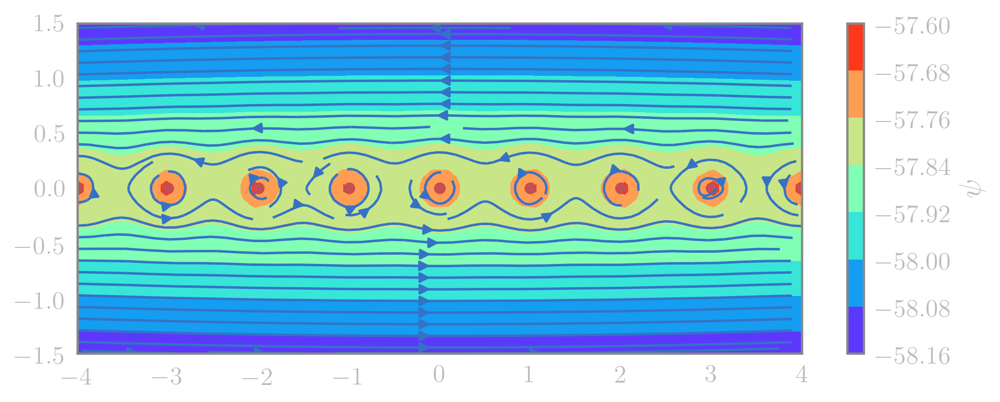

In [9]:
# Vortices
a = 1.0
N = 100
x_dom = np.linspace(-N*a, N*a, 2*N + 1)
# gammas = np.random.randint(-18,18, 2*N + 1)
gamma = 1.0
# vortices = [ Vortex2D(gamma, x, 0) for (gamma, x) in zip(gammas, x_dom) ]
vortices = [ Vortex2D(gamma, x, 0) for x in x_dom ]

# Flow field
grid_size = 50
# x_domain, y_domain = (-N*a, N*a), (-3, 3)
x_domain, y_domain = (-4, 4), (-1.5, 1.5)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

# Computations
vels = [ sum([ vortex.velocity(X, Y)[i] for vortex in vortices ]) for i in range(2) ]
streams = sum([ vortex.stream_func(X, Y) for vortex in vortices ])
pots = sum([ vortex.potential(X, Y) for vortex in vortices ])

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig11 = plt.figure(1, figsize=(width, height), dpi=300)
plt.streamplot(X, Y, vels[0], vels[1], density=1)
plt.contourf(X, Y, streams, cmap=cm.rainbow)
plt.colorbar(label=r'$\psi$')
[ plt.scatter(vortex.x_0, 0, color='r', marker='o') for vortex in vortices ]
plt.xlim(x_domain)
plt.ylim(y_domain);

#### Infinite Row of Vortices

 See what happens if you extend the number $N$ to infinity and treat the mathematics lightly. Consider the complex potential of the vortices:

$$ \Psi(z) = \lim_{N \to \infty} -\frac{\Gamma}{2\pi} \sum_{n = -N}^N \ln{(z - z_n)} = \lim_{N \to \infty} -\frac{\Gamma}{2\pi}\ln{\prod_{n = -N}^N (z - na)}, \quad \Re(z_n) = x_n,\ \Im(z_n) = 0,\ x_{n+1} - x_n = a, \; a \in \mathbb R  $$
 
Note that this is not well-defined when $\Re(z) = na$, so this function must be regularised.

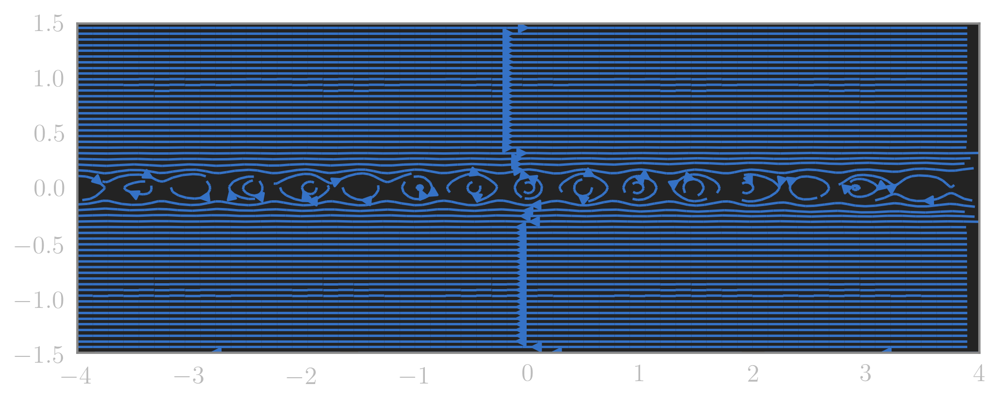

In [10]:
# Vortices
gamma = -1.0
a = 0.5
inf_vortices = InfiniteVortices(gamma, a)

# Flow field
grid_size = 50
x_domain, y_domain = (-4, 4), (-1.5, 1.5)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

# Computations
vels = inf_vortices.velocity(X, Y)

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig12 = plt.figure(1, figsize=(width, height), dpi=300)
plt.streamplot(X, Y, vels[0], vels[1], density=2)
plt.xlim(x_domain)
plt.ylim(y_domain);

## Lifting Flow over a Cylinder

Consider the flow over a cylinder shown previously, constructed by superposing a uniform flow in line with a doublet ($\alpha = 0$). Now let's make it rotate by adding a clockwise vortex ($\Gamma < 0 $) to attempt to model the Magnus effect.

Stream function: 

$$ \psi(r, \theta) = U_{\infty}r\sin\theta\left(1 - \frac{r_s}{r^2}\right) - \frac{\Gamma}{2\pi}\ln{r}$$ 

Stagnation points $(r_{\mathrm{stag}}, \theta_{\mathrm{stag}})$:

$$ U_{\infty}\cos\theta_{\mathrm{stag}}\left(1 - \frac{r_s^2}{r_\mathrm{stag}^2}\right) = 0 \implies r_{\mathrm{stag}} = r_s$$

$$ -U_{\infty}\sin\theta_{\mathrm{stag}}\left(1 + \frac{r_s^2}{r_\mathrm{stag}^2}\right) + \frac{\Gamma}{2\pi r_\mathrm{stag}} = 0 \implies \theta_{\mathrm{stag}} = \sin^{-1}\frac{\Gamma}{4\pi U_{\infty} r_s }$$

$$ \implies (r_{\mathrm{stag}}, \theta_{\mathrm{stag}}) = \left(\sqrt{\frac{\kappa}{2\pi U_{\infty}}}, \sin^{-1}\frac{\Gamma}{\sqrt{8\pi U_{\infty}\kappa}} \right) $$

In Cartesian coordinates:

$$ (x_{\mathrm{stag}}, y_{\mathrm{stag}}) = \left(\pm r_s\left[1 - \frac{\Gamma^2}{8\pi U_{\infty}\kappa}\right], r_s\left[\frac{\Gamma}{\sqrt{8\pi U_{\infty}\kappa}}\right] \right) $$

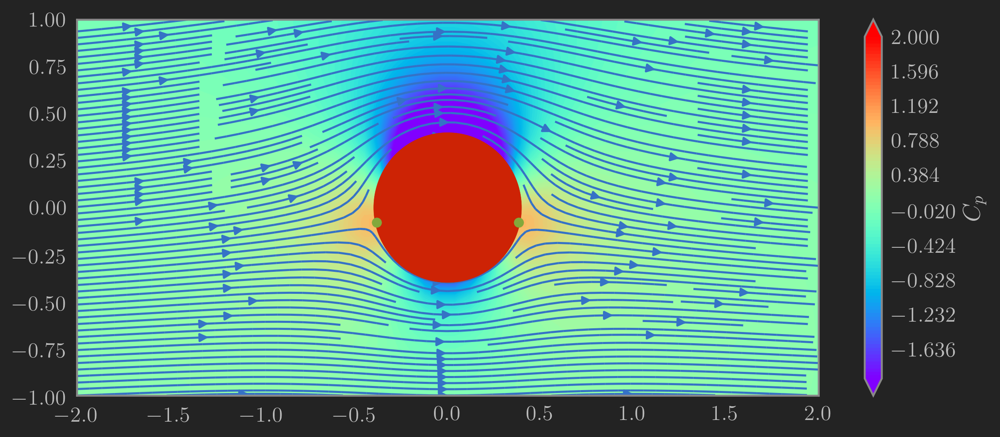

In [23]:
grid_size = 50
x_domain, y_domain = (-2, 2), (-1, 1)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

kappa = 1.0
x_doublet, y_doublet = 0.0, 0.0
uniform_mag = 1.0
uniform_ang = 0.0
gamma = -1.0
vort_x, vort_y = 0.0, 0.0

uniform = Uniform2D(uniform_mag, uniform_ang)
doublet = Doublet2D(kappa, x_doublet, y_doublet)
vortex = Vortex2D(gamma, vort_x, vort_y)
vels = [ uniform.velocity(X, Y)[i] + doublet.velocity(X, Y)[i] + vortex.velocity(X, Y)[i] for i in range(2) ]
streams = uniform.stream_func(X, Y) + doublet.stream_func(X, Y) + vortex.stream_func(X, Y)
pots = uniform.potential(X, Y) + doublet.potential(X, Y) + vortex.potential(X, Y)
cp = pressure_coefficient2D(vels[0], vels[1], uniform_mag)

# Stagnation points
r_s = np.sqrt(kappa/(2*np.pi*uniform_mag))
x_stag, y_stag = R*(1 - gamma**2/(4*np.pi*uniform_mag*R)**2), R*gamma/(4*np.pi*uniform_mag*R)

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig13 = plt.figure(1, figsize=(width*1.2, height), dpi=300)
plt.contourf(X, Y, cp, levels=np.linspace(x_domain[0], x_domain[1], 100), extend='both', cmap=cm.rainbow)
plt.colorbar(label=r'$C_p$')
plt.streamplot(X, Y, vels[0], vels[1], density=2, zorder=1)
# CS1 = plt.contour(X, Y, streams, levels=[0.], colors='g', linewidths=2, linestyles='solid')
circle = plt.Circle((0, 0), radius=r_s, color='#CD2305', alpha=1.0)
plt.gca().add_patch(circle)
plt.scatter(x_stag, y_stag, color='g', zorder=2)
plt.scatter(-x_stag, y_stag, color='g', zorder=2)
plt.xlim(x_domain)
plt.ylim(y_domain);

#### Pressure Coefficient Comparison

The pressure coefficient for the lifting flow over the cylinder's surface is:

$$ C_p = 1 - \frac{1}{U_{\infty}^2}\left(-2U_{\infty}\sin\theta + \frac{\Gamma}{2\pi r_s}\right)^2 = 1 - 4\sin^2{\theta} + \frac{2\Gamma \sin\theta}{\pi U_{\infty} r_s} + \frac{\Gamma^2}{4\pi^2U_{\infty}^2 r_s^2}$$

Comparing this with the non-vortex flow:

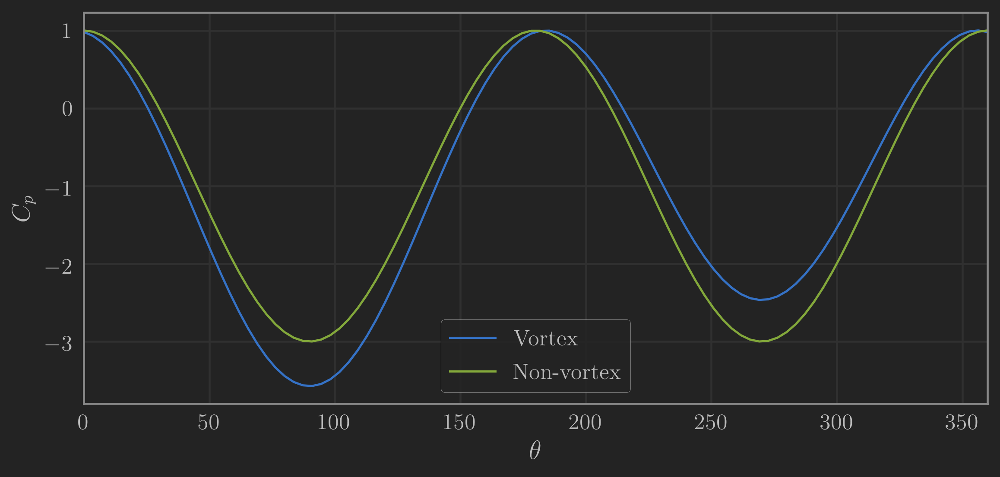

In [21]:
non_vortex_speed = lambda t: -2*uniform_mag*np.sin(t)
vortex_speed = lambda t: -2*uniform_mag*np.sin(t) + gamma/(2*np.pi*R)

thetas = np.linspace(0, 2*np.pi, 100)
cp_v = [ pressure_coefficient2D(0, vortex_speed(theta), uniform_mag) for theta in thetas ]
cp_nv = [ pressure_coefficient2D(0, non_vortex_speed(theta), uniform_mag) for theta in thetas ]

x_domain, y_domain = (0, 360), (-1, 1)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
fig14 = plt.figure(1, figsize=(9,4), dpi=300)
plt.plot(thetas*180/np.pi, cp_v, thetas*180/np.pi, cp_nv)
plt.xlim(x_domain)
plt.xlabel(r'$\theta$')
plt.ylabel(r'$C_p$')
plt.legend(['Vortex', 'Non-vortex'])
plt.grid();

The lift and drag forces across the cylinder are calculated by integrating the local pressures along the surface:

\begin{align*}
D & = -\int_0^{2\pi} p\cos\theta \ r_s \ d\theta = -\int_0^{2\pi} \frac{1}{2}\rho U_{\infty}^2 C_p\cos\theta \ r_s \ d\theta \\
& = -\frac{1}{2}\rho U_{\infty}^2 r_s \int_0^{2\pi}  \left(1 - 4\sin^2{\theta} + \frac{2\Gamma \sin\theta}{\pi U_{\infty} r_s} + \frac{\Gamma^2}{4\pi^2U_{\infty}^2 r_s^2}\right)\cos\theta \ d\theta = 0
\end{align*}

\begin{align*}
L & = -\int_0^{2\pi} p\sin\theta \ r_s \ d\theta = -\frac{1}{2}\rho U_{\infty}^2 r_s \int_0^{2\pi}  \left(1 - 4\sin^2{\theta} + \frac{2\Gamma \sin\theta}{\pi U_{\infty} r_s} + \frac{\Gamma^2}{4\pi^2U_{\infty}^2 r_s^2}\right)\sin\theta \ d\theta \\
& = 
\end{align*}

## Conformal Mappings

A **conformal mapping** in the complex plane is a transformation $f\colon \mathbb C \to \mathbb C$ that preserves angles. An analytic function is conformal wherever it has non-zero derivatives. Conversely, a conformal mapping with continuous partial derivatives is analytic.

_Note:_ Python represents complex numbers like electrical engineers, i.e. $i \equiv \texttt{j}$.

#### Joukowski Transformation

A **Joukowski transformation** is a conformal mapping that is infamous in aerodynamics for mapping a circle to an airfoil shape, opening up a range of inverse design problems for analysis of lifting flows over a special subset of possible airfoil shapes.

$$ \xi_x + i\xi_y = \xi(z) = z + \frac{c^2}{z} $$

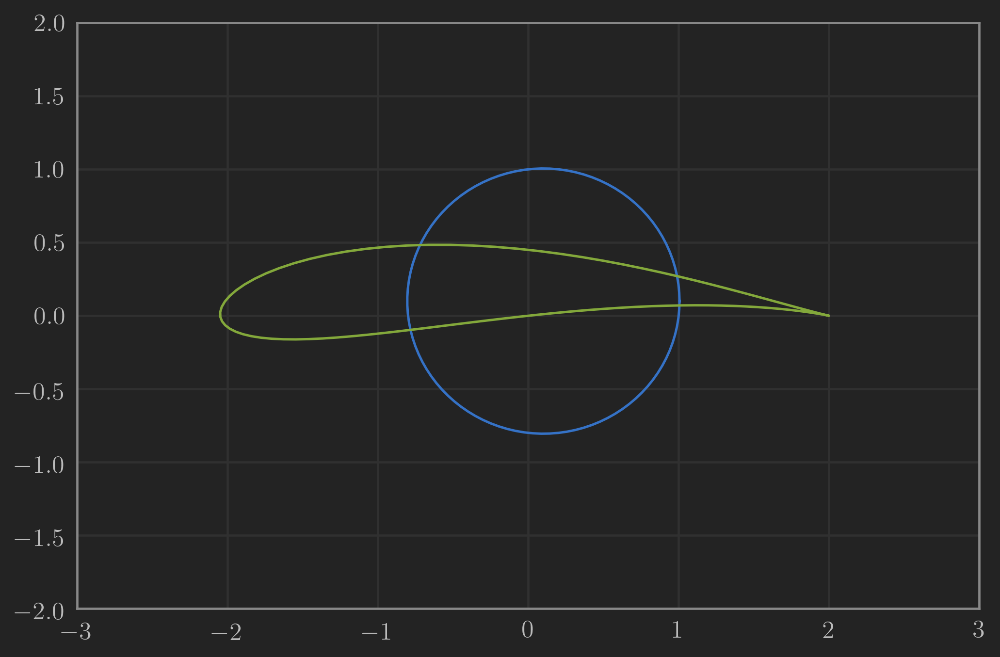

In [73]:
grid_size = 50
x_domain, y_domain = (-3, 3), (-2, 2)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

# Circle definition
c = 1.0
# R = 1.2
x, y = 0.1, 0.1
R = np.sqrt((c - x)**2 + y**2)
thetas = np.linspace(0, 2*np.pi, 100)
zs = [ complex(R*np.cos(theta) + x, R*np.sin(theta) + y) for theta in thetas ]
xis = [ joukowski(z, c) for z in zs ]

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig6 = plt.figure(3, figsize=(width, height), dpi=300)
plt.plot([ z.real for z in zs ], [ z.imag for z in zs])
plt.plot([ z.real for z in xis ], [ z.imag for z in xis ])
plt.xlim(x_domain)
plt.ylim(y_domain)
plt.grid()
plt.show()

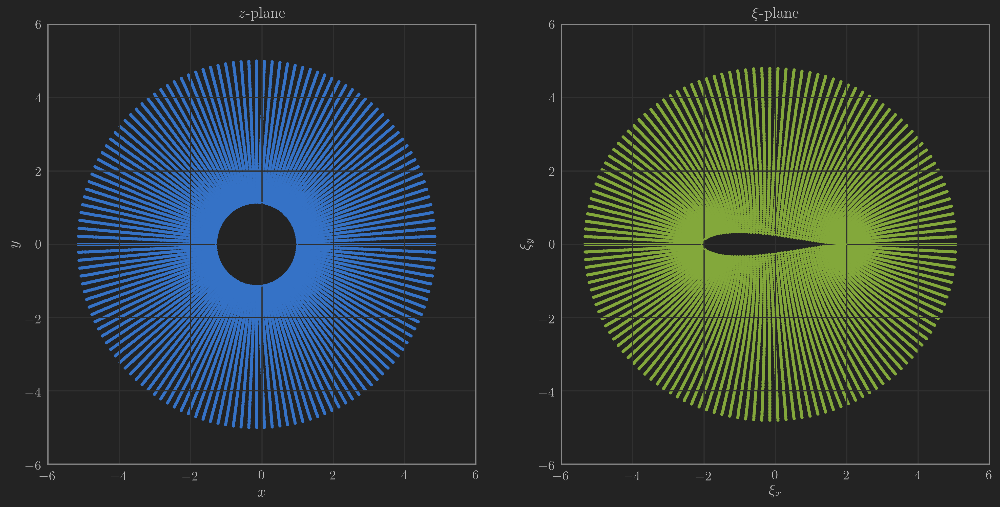

In [25]:
grid_size = 50
x_domain, y_domain = (-6, 6), (-6, 6)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

# Circle definition
c = 1.0
# R = 1.2
x, y = -0.15, 0
R = 1.15
polars = np.linspace(R, 5, 100)
thetas = np.linspace(0, 2*np.pi, 145)
points = [ complex(r*np.cos(theta) + x, r*np.sin(theta) + y) for r in polars for theta in thetas ]
zs = [ complex(R*np.cos(theta) + x, R*np.sin(theta) + y) for theta in thetas ]
xipoints = [ joukowski(z, c) for z in points ]
xis = [ joukowski(z, c) for z in zs ]

width = 16.0
height = 0.48 * (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig15 = plt.figure(3, figsize=(width, height), dpi=300)
plt.subplot(1,2,1)
plt.plot([ z.real for z in zs ], [ z.imag for z in zs])
plt.scatter([ z.real for z in points ], [ z.imag for z in points ], marker='.')
plt.xlabel('$x$')
plt.ylabel('$y$')
plt.title('$z$-plane')
plt.xlim(x_domain)
plt.ylim(y_domain)
plt.grid()

plt.subplot(1,2,2)
plt.plot([ z.real for z in xis ], [ z.imag for z in xis ], color='g')
plt.scatter([ z.real for z in xipoints ], [ z.imag for z in xipoints ], color='g', marker='.')
plt.xlabel(r'$\xi_x$')
plt.ylabel(r'$\xi_y$')
plt.title(r'$\xi$-plane')
plt.xlim(x_domain)
plt.ylim(y_domain)
plt.grid()

plt.show()

#### Transforming Uniform Flow with Doublet

## Method of Images

The **method of images** is a technique used in inviscid incompressible flows/electrostatics to approximate the streamlines/electric field lines near a wall by superposing "image" solutions in a plane of reflection to cancel the fields appropriately, and analysing the field in only one plane of symmetry. This is a powerful tool for obtaining the electric fields of more complicated shapes by superposition of simpler shapes and taking advantage of symmetry.

#### Source near a plane wall

This is direct; two sources mirrored about a plane of symmetry.

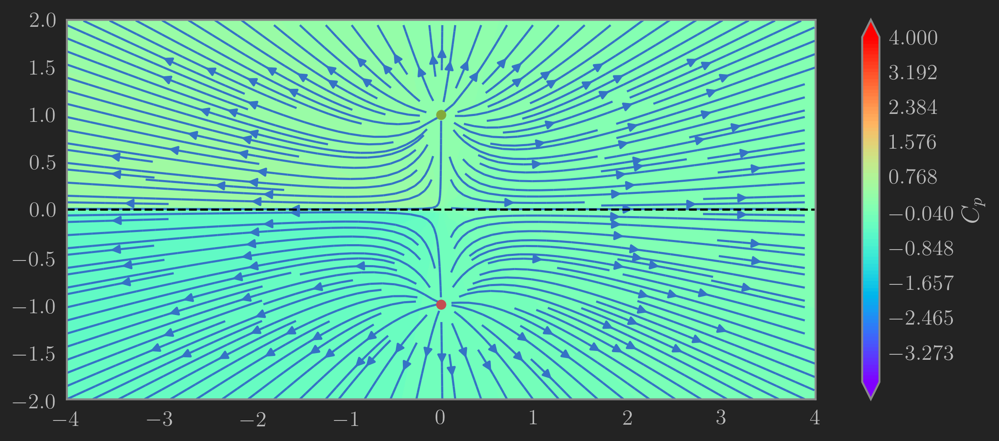

In [36]:
grid_size = 50
x_domain, y_domain = (-4, 4), (-2, 2)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

sigma = 1.0
x1, y1 = 0.0, 1.0
source = Source2D(sigma, x1, y1)
image = Source2D(sigma, x1, -y1)

vels = [ source.velocity(X, Y)[i] + image.velocity(X, Y)[i] for i in range(2) ]
streams = source.stream_func(X, Y) + image.stream_func(X, Y)
pots = source.potential(X, Y) + image.potential(X, Y)

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig16 = plt.figure(1, figsize=(width*1.2, height), dpi=300)
plt.contourf(X, Y, pot, levels=np.linspace(x_domain[0], x_domain[1], 100), extend='both', cmap=cm.rainbow)
plt.colorbar(label=r'$C_p$')
plt.streamplot(X, Y, vels[0], vels[1], density=2)
plt.plot(np.linspace(x_domain[0], x_domain[1], grid_size), np.zeros(grid_size), '--', color='black')
# CS1 = plt.contour(X, Y, streams, levels=[0.], colors='g', linewidths=2, linestyles='solid')
plt.scatter(x1, y1, color='g', zorder=2)
plt.scatter(x1, -y1, color='r', zorder=2)
plt.xlim(x_domain)
plt.ylim(y_domain);

#### Vortex near a plane wall

This requires a little bit of thinking, but the previous examples help establish that the sign of the image vortex must be opposite of the original's.

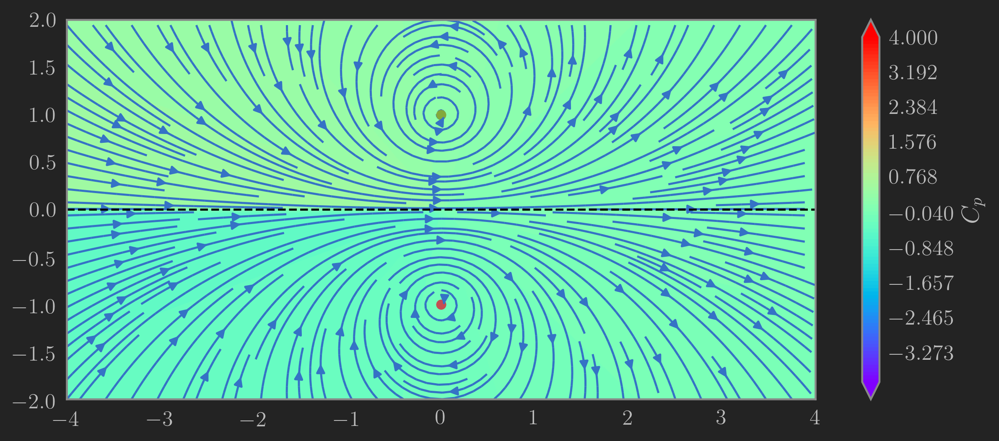

In [39]:
grid_size = 50
x_domain, y_domain = (-4, 4), (-2, 2)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

gamma = 1.0
x1, y1 = 0.0, 1.0
vortex = Vortex2D(gamma, x1, y1)
image = Vortex2D(-gamma, x1, -y1)

vels = [ vortex.velocity(X, Y)[i] + image.velocity(X, Y)[i] for i in range(2) ]
streams = vortex.stream_func(X, Y) + image.stream_func(X, Y)
pots = vortex.potential(X, Y) + image.potential(X, Y)

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig16 = plt.figure(1, figsize=(width*1.2, height), dpi=300)
plt.contourf(X, Y, pot, levels=np.linspace(x_domain[0], x_domain[1], 100), extend='both', cmap=cm.rainbow)
plt.colorbar(label=r'$C_p$')
plt.streamplot(X, Y, vels[0], vels[1], density=2)
plt.plot(np.linspace(x_domain[0], x_domain[1], grid_size), np.zeros(grid_size), '--', color='black')
# CS1 = plt.contour(X, Y, streams, levels=[0.], colors='g', linewidths=2, linestyles='solid')
plt.scatter(x1, y1, color='g', zorder=2)
plt.scatter(x1, -y1, color='r', zorder=2)
plt.xlim(x_domain)
plt.ylim(y_domain);

#### Vortex pair near a wall

The pair of vortices should have opposing rotations.

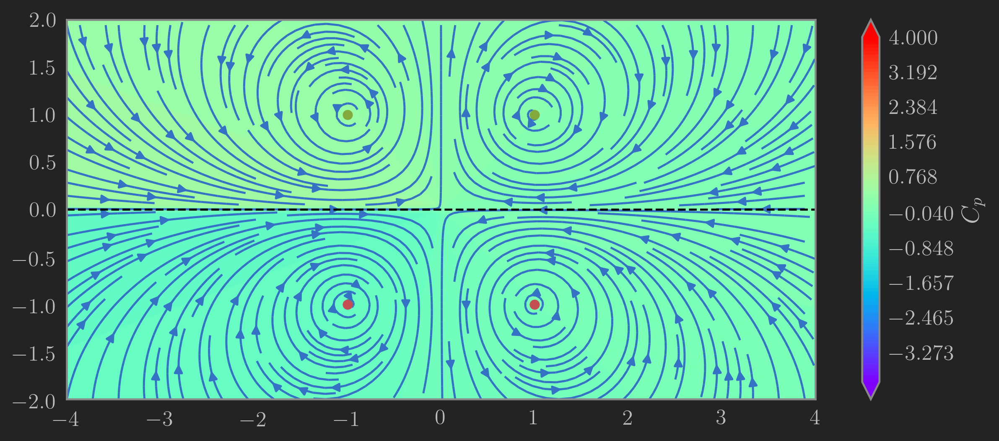

In [45]:
grid_size = 50
x_domain, y_domain = (-4, 4), (-2, 2)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

gamma = 1.0
x1, y1 = -1.0, 1.0
vortex1 = Vortex2D(gamma, x1, y1)
vortex2 = Vortex2D(-gamma, -x1, y1)
image1 = Vortex2D(-gamma, x1, -y1)
image2 = Vortex2D(gamma, -x1, -y1)

vels = [ vortex1.velocity(X, Y)[i] + vortex2.velocity(X, Y)[i] + image1.velocity(X, Y)[i] + image2.velocity(X, Y)[i] for i in range(2) ]
streams = vortex1.stream_func(X, Y) + vortex2.stream_func(X, Y) + image1.stream_func(X, Y) + image2.stream_func(X, Y)
pots = vortex1.potential(X, Y) + vortex2.stream_func(X, Y) + image1.potential(X, Y) + image2.potential(X, Y)

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig17 = plt.figure(1, figsize=(width*1.2, height), dpi=300)
plt.contourf(X, Y, pot, levels=np.linspace(x_domain[0], x_domain[1], 100), extend='both', cmap=cm.rainbow)
plt.colorbar(label=r'$C_p$')
plt.streamplot(X, Y, vels[0], vels[1], density=2)
plt.plot(np.linspace(x_domain[0], x_domain[1], grid_size), np.zeros(grid_size), '--', color='black')
# CS1 = plt.contour(X, Y, streams, levels=[0.], colors='g', linewidths=2, linestyles='solid')
plt.scatter(x1, y1, color='g', zorder=2)
plt.scatter(x1, -y1, color='r', zorder=2)
plt.scatter(-x1, y1, color='g', zorder=2)
plt.scatter(-x1, -y1, color='r', zorder=2)
plt.xlim(x_domain)
plt.ylim(y_domain);

#### Doublet near a plane wall parallel to a uniform flow

In this case, it is probable to guess, without computation, that a cylinder could generate 'downward lift' as the result of a "ground effect", which squashes the streamlines near the wall (thus increasing the speed and reducing the pressure along that side) and makes the pressure distribution along the cylinder asymmetric.

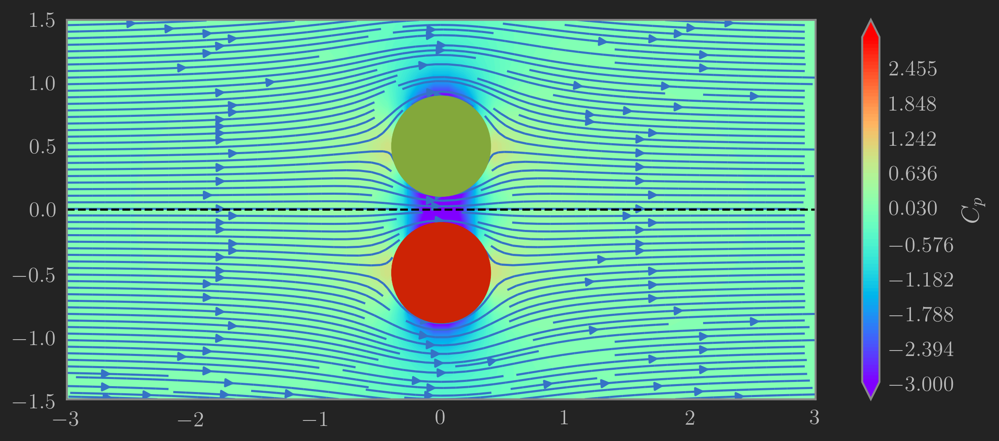

In [113]:
grid_size = 50
x_domain, y_domain = (-3, 3), (-1.5, 1.5)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

kappa = 1.0
x_doublet, y_doublet = 0.0, 0.5
uniform_mag = 1.0
uniform_ang = 0.0

uniform = Uniform2D(uniform_mag, uniform_ang)
doublet1 = Doublet2D(kappa, x_doublet, y_doublet)
doublet2 = Doublet2D(kappa, x_doublet, -y_doublet)
vels = [ uniform.velocity(X, Y)[i] + doublet1.velocity(X, Y)[i] + doublet2.velocity(X, Y)[i] for i in range(2) ]
streams = uniform.stream_func(X, Y) + doublet1.stream_func(X, Y) + doublet2.stream_func(X, Y)
pots = uniform.potential(X, Y) + doublet1.potential(X, Y) + doublet2.potential(X, Y)
cp = pressure_coefficient2D(vels[0], vels[1], uniform_mag)

r_s = np.sqrt(kappa/(2*np.pi*uniform_mag))

width = 8
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig18 = plt.figure(1, figsize=(width*1.2, height), dpi=300)
plt.streamplot(X, Y, vels[0], vels[1], density=2)
plt.contourf(X, Y, cp, levels=np.linspace(x_domain[0], x_domain[1], 100), extend='both', cmap=cm.rainbow)
plt.colorbar(label=r'$C_p$')
plt.plot(np.linspace(x_domain[0], x_domain[1], grid_size), np.zeros(grid_size), '--', color='black')
circle1 = plt.Circle((x_doublet, y_doublet), radius=r_s, color='g', alpha=1, zorder=2)
circle2 = plt.Circle((x_doublet, -y_doublet), radius=r_s, color='#CD2305', alpha=1, zorder=2)
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.xlim(x_domain)
plt.ylim(y_domain);

#### Lifting flow over a cylinder near a wall

Would adding a wall to a lifting flow simulate a ground effect and increase the lift generated?

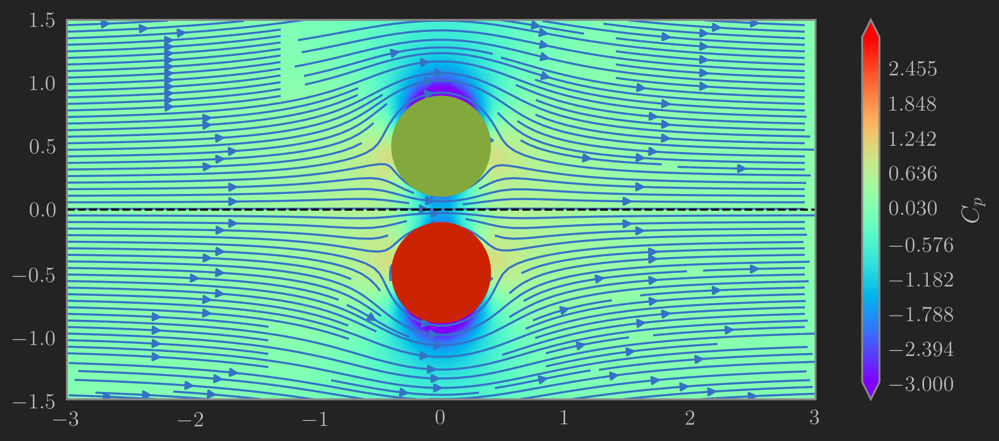

In [118]:
grid_size = 50
x_domain, y_domain = (-3, 3), (-1.5, 1.5)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

kappa = 1.0
x_doublet, y_doublet = 0.0, 0.5
uniform_mag = 1.0
uniform_ang = 0.0
gamma = -1.0
x_vortex, y_vortex = x_doublet, y_doublet

uniform = Uniform2D(uniform_mag, uniform_ang)
doublet1 = Doublet2D(kappa, x_doublet, y_doublet)
doublet2 = Doublet2D(kappa, x_doublet, -y_doublet)
vortex1 = Vortex2D(gamma, x_vortex, y_vortex)
vortex2 = Vortex2D(-gamma, x_vortex, -y_vortex)

vels = ([ uniform.velocity(X, Y)[i] 
         + doublet1.velocity(X, Y)[i] + doublet2.velocity(X, Y)[i] 
         + vortex1.velocity(X, Y)[i] + vortex2.velocity(X, Y)[i] for i in range(2) ])
streams = uniform.stream_func(X, Y) + doublet1.stream_func(X, Y) + doublet2.stream_func(X, Y) + vortex1.stream_func(X, Y) + vortex2.stream_func(X, Y)
pots = uniform.potential(X, Y) + doublet1.potential(X, Y) + doublet2.potential(X, Y) + vortex1.potential(X, Y) + vortex2.potential(X, Y)
cp = pressure_coefficient2D(vels[0], vels[1], uniform_mag)

r_s = np.sqrt(kappa/(2*np.pi*uniform_mag))

width = 8
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig18 = plt.figure(1, figsize=(width*1.2, height), dpi=300)
plt.streamplot(X, Y, vels[0], vels[1], density=2)
plt.contourf(X, Y, cp, levels=np.linspace(x_domain[0], x_domain[1], 100), extend='both', cmap=cm.rainbow)
plt.colorbar(label=r'$C_p$')
plt.plot(np.linspace(x_domain[0], x_domain[1], grid_size), np.zeros(grid_size), '--', color='black')
circle1 = plt.Circle((x_doublet, y_doublet), radius=r_s, color='g', alpha=1, zorder=2)
circle2 = plt.Circle((x_doublet, -y_doublet), radius=r_s, color='#CD2305', alpha=1, zorder=2)
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.xlim(x_domain)
plt.ylim(y_domain);

## Source Sheet

This is analogous to a vortex sheet, except it's an infinite number of sources in a given line segment. In this case, we will first construct a  lattice along the $y$-axis, and then a sheet.

#### Source lattice facing a uniform flow

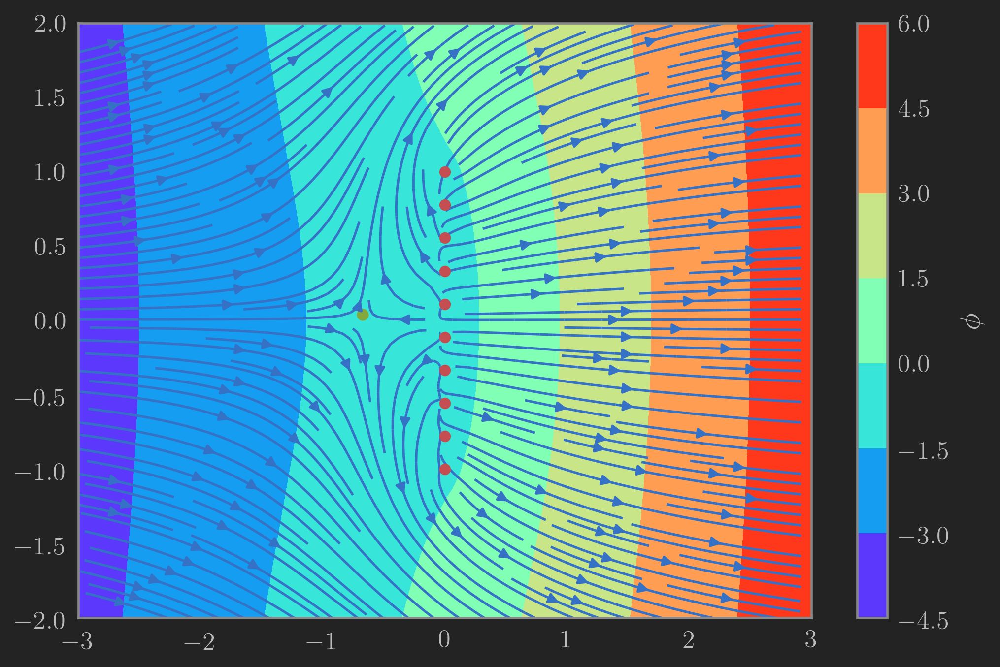

In [111]:
grid_size = 50
x_domain, y_domain = (-3, 3), (-2, 2)
x_dom, y_dom = np.linspace(x_domain[0], x_domain[1], grid_size), np.linspace(y_domain[0], y_domain[1], grid_size)
X, Y = np.meshgrid(x_dom, y_dom)

uniform_mag = 1.5
uniform_ang = 0.0
sigma = 1.0
a = 1.0
N = 10
ys = np.linspace(-1, 1, N)

uniform = Uniform2D(uniform_mag, uniform_ang)
sources = [ Source2D(sigma, 0, y) for y in ys ]

vels = [ uniform.velocity(X, Y)[i] + sum([ source.velocity(X, Y)[i] for source in sources ]) for i in range(2) ]
streams = uniform.stream_func(X, Y) + sum([ source.stream_func(X, Y) for source in sources ])
pots = uniform.potential(X, Y) + sum([ source.potential(X, Y) for source in sources ])

speed = np.sqrt(vels[0]**2 + vels[1]**2)
j_stagn, i_stagn = np.unravel_index(speed.argmin(), speed.shape)

width = 8.0
height = (y_domain[1] - y_domain[0]) / (x_domain[1] - x_domain[0]) * width
fig11 = plt.figure(1, figsize=(width, height), dpi=300)
plt.streamplot(X, Y, vels[0], vels[1], density=2)
plt.contourf(X, Y, pots, cmap=cm.rainbow)
plt.colorbar(label=r'$\phi$')
[ plt.plot(0, source.y_0, color='r', marker='o') for source in sources ]
plt.scatter(x_dom[i_stagn], y_dom[j_stagn], color='g')
plt.xlim(x_domain)
plt.ylim(y_domain);

#### Source sheet facing a uniform flow

As the number of sources goes to infinity, the spacing $ds$ between them reduces, and $\sigma$ is now defined as the source per unit length, hence $\sigma\ ds$ characterises the strength of an infinitesimal strip of the source sheet. So the stream function of each infinitesimal sheet must be integrated over to obtain the stream function of the entire sheet:

$$ \int d \psi(r,\theta) = \int\frac{\sigma}{2\pi}\theta(s)\ ds $$

For the current case with vertical spacing $\zeta$ in Cartesian coordinates:

$$ \psi(r,\theta) = \frac{\sigma}{2\pi}\int_{y_{\mathrm{min}}}^{y_{\mathrm{max}}} \tan^{-1}\left(\frac{y - \zeta}{x}\right)\ d\zeta $$

This integral is evaluated by parts to give:

$$ \psi(r, \theta) = -\frac{\sigma}{2\pi}\left[\left|\left(\frac{y - \zeta}{x}\right)\tan^{-1}\left(\frac{y - \zeta}{x}\right)\right|^{y_{\mathrm{max}}}_{y_{\mathrm{min}}} - \left|\frac{1}{2}\ln{\left[1 + \left(\frac{y - \zeta}{x}\right)^2\right]}\right|^{y_{\mathrm{max}}}_{y_{\mathrm{min}}}\right] $$